In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Python meetup Rotterdam

#  Who am I? Background

<img src="static/me.jpg" alt="me" width="30%">

## Bas Nijholt
### bas@nijho.lt | www.nijho.lt | github.com/basnijholt

* PhD in computational quantum mechanics on the TU Delft
  * Writing my thesis now (done in Jan 2020)
* Lot of high performance computing
* Last year on this meetup, presented Adaptive (github.com/python-adaptive/adaptive)
<img src="static/learner2D.gif" alt="adaptive.Learner2D" width="50%">
<img src="static/stars.jpg" alt="adaptive.Learner2D" width="20%">

## This is a quantum calculation in progress calculated using Adaptive

* from *Enhanced proximity effect in zigzag-shaped Majorana Josephson junctions* https://arxiv.org/abs/1903.06168

In [2]:
from IPython.display import Video
Video("static/movie.mp4", embed=True, width=500)

* I like open-source software and like to contribute
  * gh/basnijholt/adaptive-scheduler: Run many functions on many cores (>10k) using mpi4py.futures, ipyparallel, or dask-mpi.
  * gh/basnijholt/day-one-story-sender: Program to automate emailing my gf journal entries from shared vacations
  * gh/basnijholt/arxiv-feed-mailer: automatically email me about interesting papers from arXiv
  * gb/basnijholt/psychedelic-data-science: crawling user experience data from erowid.org 🍄
  * gh/basnijholt/crypto-bot: Automatically trade crypto currencies and get 💰💵🤑
* my contributions on GitHub
<img src="static/github.jpg" alt="gb" width="70%">

* PhD -> a lot of vacation (blank spots)
* vacation + landscape photography hobby

# [Instacron](https://github.com/basnijholt/instacron) -- instagram for the lazy
## [instagram.com/bnijholt](https://www.instagram.com/bnijholt/)
## [github.com/basnijholt/instacron](https://github.com/basnijholt/instacron)

<img src="static/des1.jpg" alt="Smiley face" width="40%"> <img src="static/des2.jpg" alt="Smiley face" width="40%">

# What I will talk about
* Step-by-step flow of the program
* `pre-commit` and linters for beautifully styled Python code

# API

```bash
$ ./instacron.py -h
usage: instacron.py [-h] [--fname fname] [--caption_only]

Instacron.

optional arguments:
  -h, --help      show this help message and exit
  --fname fname   filename of the photo, random if empty.
  --caption_only  only return the caption.
```


* Either supply a photo manually using `fname` or it takes it from a folder named `photos`
* Optionally only return the caption with the `--caption_only` flag

# Breaking up the problem in pieces

* Getting a quote
* Getting photo information
  * Location
    1. From GPS: convert GPS coordinates to location
    2. From Filename: parse the filenames
  * Reading EXIF information to extract camera settings
* Generating hashtags
* Combining the information into a `str`
* Crop the photo if it has an incorrect aspect ratio
* Upload to Instagram

### Getting a quote

In [3]:
import instacron

In [4]:
# From a random person
instacron.get_random_quote(None)

'Make the most of yourself for that is all there is of you. '

In [5]:
# From some of my favorite writers / people
quote = instacron.get_random_quote(
    ["Hunter S. Thompson", "Albert Einstein", "Charles Bukowski"]
)
print(quote)

A nervous blonde nymphet who thought that politics was some kind of game played by old people, like bridge.


This can be dangerous:
<img src="static/ica1.jpg" alt="Smiley face" width="50%"> <img src="static/ica2.jpg" alt="Smiley face" width="50%">

### Getting a photo

In [6]:
!ls photos

009-20150925-Peru-Lima.jpg
010-20170319-Brazil-Pipa Beach-conference-PhD-life.jpg
012-20150926-Peru-Lima.jpg
012-Rijksmuseum-Amsterdam-20160220.jpg
017-20170319-Brazil-Tibau do Sul-conference-PhD-life.jpg
0202-20170608-Mexico-Heroica Puebla de Zaragoza-met-Marcella.jpg
025-20150928-Peru-Iquitos.jpg
032-20160803-India-Jaisalmer-with-Marcella.jpg
032-20170320-Brazil-Pipa Beach-conference-PhD-life.jpg
033-20170822-Italy-Provincia di Belluno.jpg
035-20170423-Netherlands-Rotterdam-nieuwe-zoom-lens.jpg
036-20150929-Peru-Iquitos.jpg
042-20150929-Peru-Iquitos.jpg
043-20161119-Argentina-Bariloche.jpg
048-20150929-Peru-Iquitos.jpg
049-20150929-Peru-Iquitos.jpg
050-20150929-Peru-Iquitos.jpg
052-20170325-Brazil-Pipa Beach-conference-PhD-life.jpg
053-20161119-Argentina-Bariloche.jpg
055-20170823-Italy-Provincia di Belluno.jpg
056-20150929-Peru-Iquitos.jpg
061-20161119-Argentina-Bariloche.jpg
062-20170325-Brazil-Pipa Beach-conference-PhD-life.jpg
063-20160804-India-Jaisalmer-with-Marcella.jpg
065-20

In [7]:
!cat uploaded.txt

1821-20190721-United States-Shasta County-love-and-proposal-in-USA-with-Marcella.jpg
DSC04602.jpg
1189-20190717-United States-Mariposa County-love-and-proposal-in-USA-with-Marcella.jpg
2070-20190723-United States-Orick-love-and-proposal-in-USA-with-Marcella.jpg
1289-20190718-United States-Mariposa County-love-and-proposal-in-USA-with-Marcella.jpg
756-20151117-Peru-Cusco.jpg
0407-20190519-United States-Riverside County-Joshua Tree National Park with Sigfrido.jpg
0407-20190519-United States-Riverside County-Joshua Tree National Park with Sigfrido.jpg
146-20171016-Greece-Pindus Mountains-met-Daniel.jpg
321-20151017-Peru-Ica.jpg


In [8]:
photo = instacron.choose_random_photo('uploaded.txt', 'photos')
print(photo)

photos/053-20161119-Argentina-Bariloche.jpg


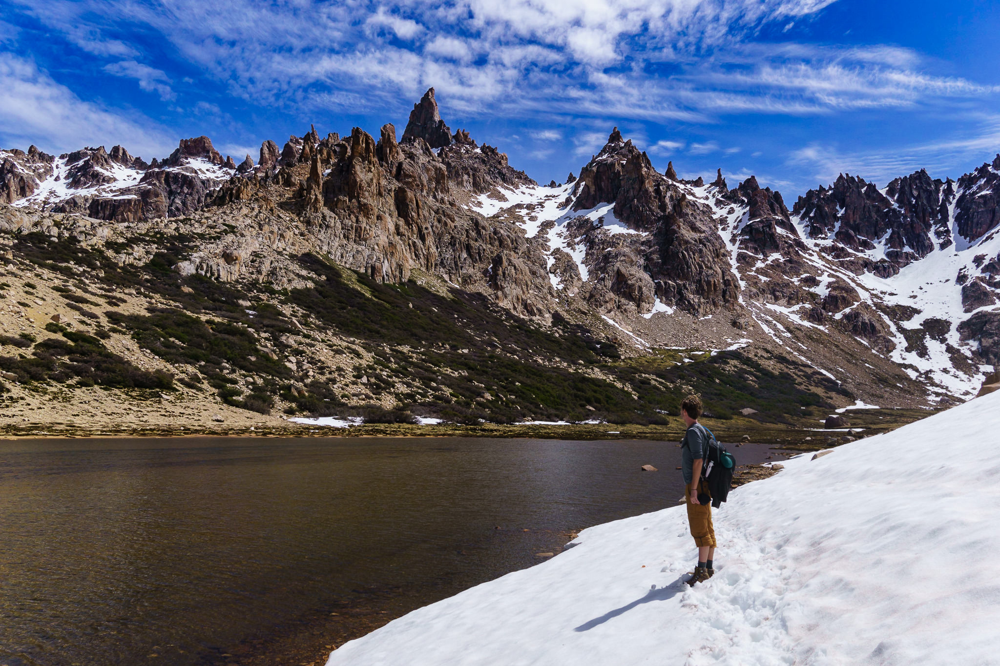

In [9]:
from IPython.display import Image
Image(photo, embed=True, width=400)

### Getting photo information

In [10]:
import exifread
with open(photo, "rb") as f:
    tags = exifread.process_file(f)
print(tags)

{'Image ImageDescription': (0x010E) ASCII=Refugio Frey Trek @ 134, 'Image Make': (0x010F) ASCII=SONY @ 152, 'Image Model': (0x0110) ASCII=ILCE-6000 @ 158, 'Image XResolution': (0x011A) Ratio=100 @ 168, 'Image YResolution': (0x011B) Ratio=100 @ 176, 'Image ResolutionUnit': (0x0128) Short=Pixels/Inch @ 78, 'Image Software': (0x0131) ASCII=Adobe Photoshop Lightroom Classic 7.2 (Macintosh) @ 184, 'Image DateTime': (0x0132) ASCII=2018:04:08 12:43:34 @ 234, 'Image ExifOffset': (0x8769) Long=254 @ 114, 'GPS GPSVersionID': (0x0000) Byte=[2, 2, 0, 0] @ 862, 'GPS GPSLatitudeRef': (0x0001) ASCII=S @ 874, 'GPS GPSLatitude': (0x0002) Ratio=[41, 59591/5000, 0] @ 930, 'GPS GPSLongitudeRef': (0x0003) ASCII=W @ 898, 'GPS GPSLongitude': (0x0004) Ratio=[71, 29209/1000, 0] @ 954, 'GPS GPSAltitude': (0x0006) Ratio=17613383/10000 @ 978, 'Image GPSInfo': (0x8825) Long=852 @ 126, 'Thumbnail Compression': (0x0103) Short=JPEG (old-style) @ 996, 'Thumbnail XResolution': (0x011A) Ratio=72 @ 1064, 'Thumbnail YReso

In [11]:
print(tags["GPS GPSLatitude"].printable)
print(tags["GPS GPSLongitude"].printable)

[41, 59591/5000, 0]
[71, 29209/1000, 0]


In [12]:
instacron._location_and_time_from_exif(photo)

([Laguna Tonchek, Sendero Frey - Jakob, Departamento Bariloche, RN, 8400, Argentina],
 datetime.datetime(2019, 9, 26, 12, 43, 34))

In [13]:
location_caption, location_hashtags = instacron._location_caption_from_GPS(photo)
print(location_caption)
print(location_hashtags)

   Taken in Laguna Tonchek, Sendero Frey - Jakob, Departamento Bariloche, RN, 8400, Argentina🇦🇷 on 26 September 2019.
['argentina']


In [14]:
location_caption, location_hashtags = instacron._location_caption_from_fname(photo)
print(location_caption)
print(location_hashtags)

   Taken in Argentina, Bariloche 🇦🇷 on 19 November 2016.
['visitbariloche', 'bariloche', 'argentina', 'ig_bariloche']


Intermezzo: This uses `parse` (kind of reversed `.format`) and is **very** useful

In [19]:
import parse

p = parse.parse(
    format="{i}-{date}-{country}-{city}.jpg",
    string="photos/1844-20160114-Colombia-Villavieja.jpg",
)
p.named

{'i': 'photos/1844',
 'date': '20160114',
 'country': 'Colombia',
 'city': 'Villavieja'}

In [22]:
instacron.random_emoji() + instacron.random_emoji() + location_caption

'🦐🍈   Taken in Argentina, Bariloche 🇦🇷 on 19 November 2016.'

### Preparing the photo
* The photo might be in the wrong aspect ratio?

Let's cut it to preserve maximum information entropy! 🤓🤓
$$S=-\sum _{i}P_{i}\log {P_{i}}.$$

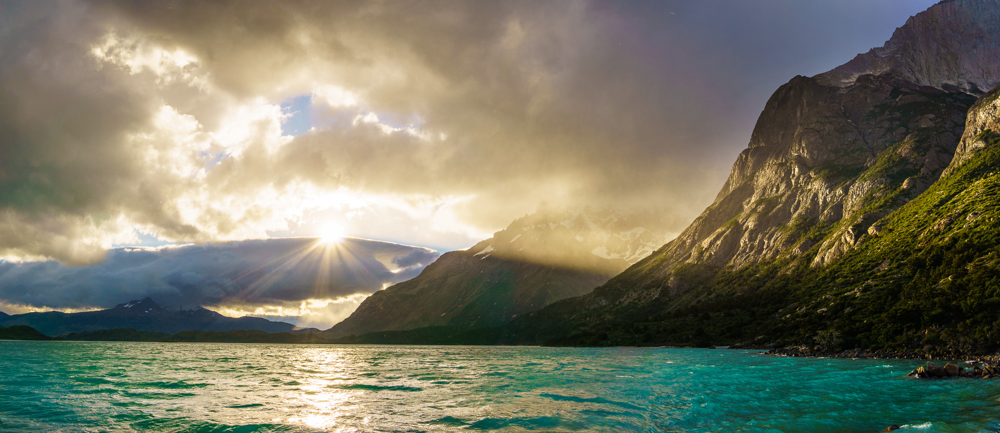

In [23]:
pano = "photos/824-20161210-Chile-Estancia Pudeto.jpg"
Image(pano)

In [ ]:
def prepare_and_fix_photo(photo):
    with open(photo, "rb") as f:
        img = PIL.Image.open(f)
        img = strip_exif(img)
        if not correct_ratio(photo):
            img = crop_maximize_entropy(img)
        photo = os.path.join(tempfile.gettempdir(), "instacron.jpg")
        img.save(photo)
    return photo

In [31]:
import PIL
img = PIL.Image.open(photo)

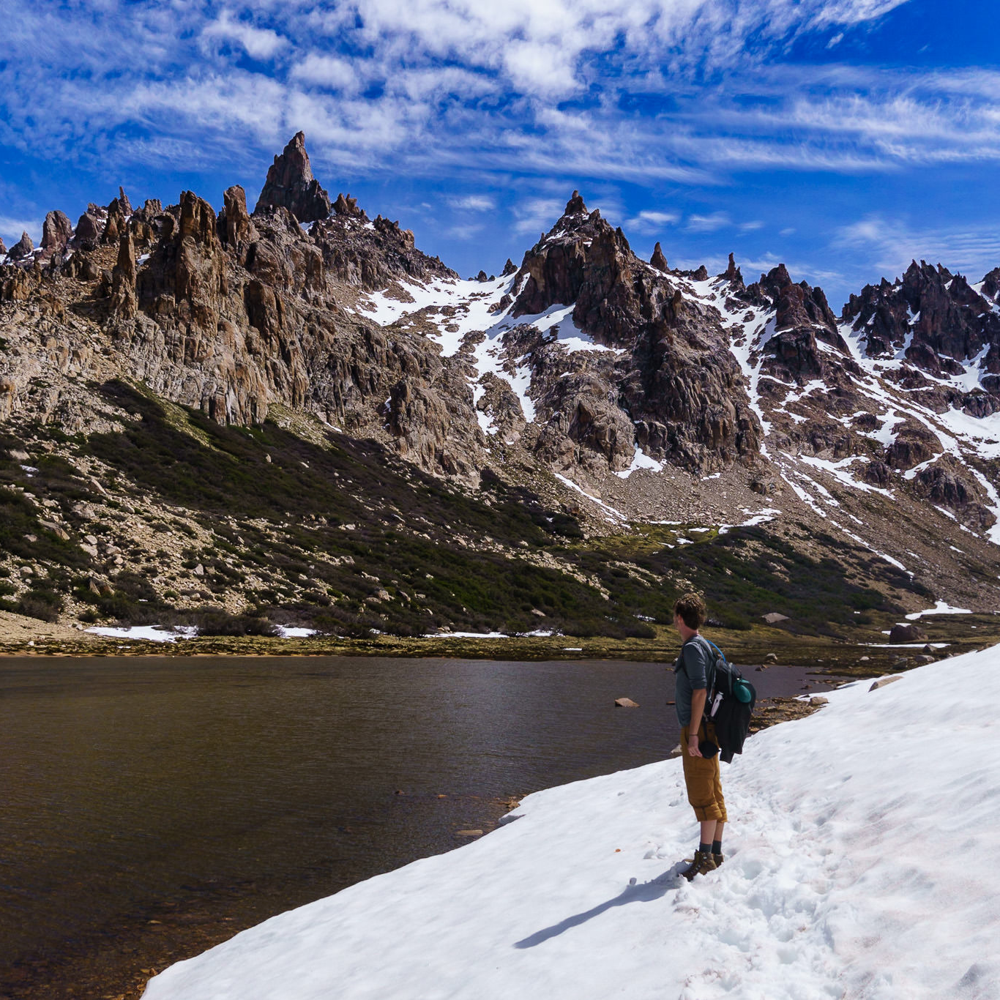

In [32]:
instacron.crop_maximize_entropy(img, 1, 1)

In [ ]:
def crop_maximize_entropy(img, min_ratio=4 / 5, max_ratio=90 / 47):
    from scipy.optimize import minimize_scalar

    w, h = img.size
    data = np.array(img)
    ratio = w / h
    if ratio > max_ratio:  # Too wide
        w_max = int(max_ratio * h)

        def _crop(x):
            return crop(x, y=0, data=data, w=w_max, h=h)

        xy_max = w - w_max
    else:  # Too narrow
        h_max = int(w / min_ratio)

        def _crop(y):
            return crop(x=0, y=y, data=data, w=w, h=h_max)

        xy_max = h - h_max

    to_minimize = lambda xy: -_entropy(_crop(xy))  # noqa: E731
    x = minimize_scalar(to_minimize, bounds=(0, xy_max), method="bounded").x
    return PIL.Image.fromarray(_crop(x))

FOUND: w:2048 h:888 r:2.3063063063063063


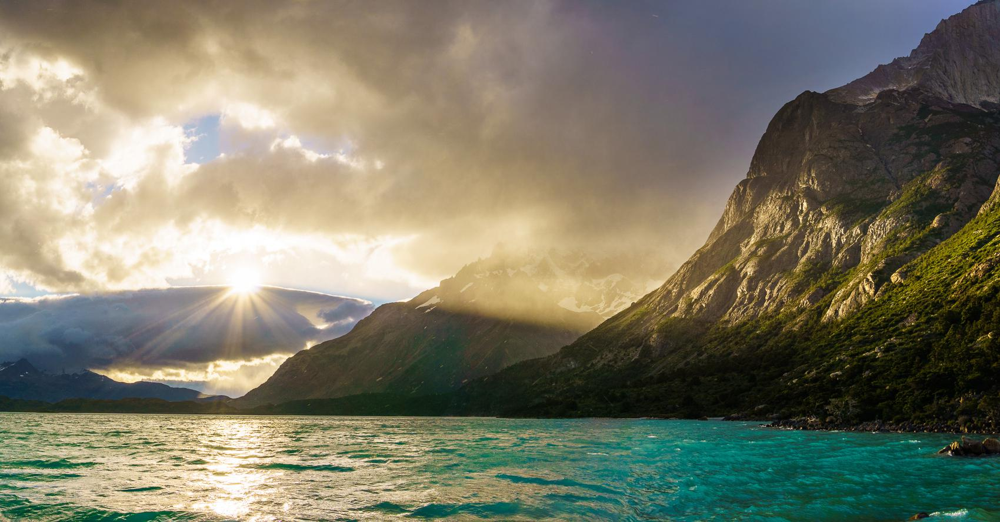

In [24]:
fixed_pano = instacron.prepare_and_fix_photo(pano)
Image(fixed_pano)

```python
def _entropy(data):
    """Calculate the entropy of an image"""
    hist = np.array(PIL.Image.fromarray(data).histogram())
    hist = hist / hist.sum()
    hist = hist[hist != 0]
    return -np.sum(hist * np.log2(hist))


def crop(x, y, data, w, h):
    x = int(x)
    y = int(y)
    return data[y : y + h, x : x + w]


def crop_maximize_entropy(img, min_ratio=4 / 5, max_ratio=90 / 47):
    from scipy.optimize import minimize_scalar

    w, h = img.size
    data = np.array(img)
    ratio = w / h
    if ratio > max_ratio:  # Too wide
        w_max = int(max_ratio * h)

        def _crop(x):
            return crop(x, y=0, data=data, w=w_max, h=h)

        xy_max = w - w_max
    else:  # Too narrow
        h_max = int(w / min_ratio)

        def _crop(y):
            return crop(x=0, y=y, data=data, w=w, h=h_max)

        xy_max = h - h_max

    to_minimize = lambda xy: -_entropy(_crop(xy))
    x = minimize_scalar(to_minimize, bounds=(0, xy_max), method="bounded").x
    return PIL.Image.fromarray(_crop(x))
```

### Finally combining the fixed photo and the quote

In [25]:
caption = quote + instacron.get_caption(photo)
print(caption)

A nervous blonde nymphet who thought that politics was some kind of game played by old people, like bridge.👏🙄   Taken in Argentina, Bariloche 🇦🇷 on 19 November 2016.#instacron 🐍 www.instacron.nijho.lt
.
.
.
📷⚙:  SONY ILCE-6000 | E 19mm F2.8 @ 19 mm | ƒ/9 | 1/500 sec | ISO 100
.
.
.
#landscapephoto #naturephotography #ig_bariloche #landscapehunter #sonyalpha #sonyA7III #theglobewanderer #places #mountains #nature_sultans #visitbariloche #instagood #photo #awesome_earthpix #bariloche #beautifuldestinations #modernoutdoors #bhfyp #adventurethatislife #landscapephotomag #argentina #landscape_lovers #ig_landscape #nationalgeographic #hunter #trip #globetrotter


### Upload it to Instagram

In [26]:
import instabot
bot = instabot.Bot()
bot.login(**instacron.read_config())

2019-09-26 20:29:19,016 - INFO - Instabot Started
2019-09-26 20:29:19,016 INFO Instabot Started


True

In [29]:
instacron.read_config()['username']

'bnijholt'

In [30]:
bot.upload_photo(fixed_pano, caption=caption)

# Useful tools for developing

## `pre-commit`
Automatically run some code before you can commit

### Tools I like to use
* [`black`](https://github.com/psf/black#how-black-wraps-lines) format the code
* [`isort`](https://github.com/timothycrosley/isort) sort imports
* [`pyupgrade`](https://github.com/asottile/pyupgrade#implemented-features) use modern syntax
* [`flake8`](https://gitlab.com/pycqa/flake8) find bugs before executing


create `.pre-commit-config.yaml`:
```yaml
repos:
-   repo: https://github.com/pre-commit/pre-commit-hooks
    rev: v1.2.3
    hooks:
    -   id: trailing-whitespace
    -   id: end-of-file-fixer
    -   id: check-docstring-first
    -   id: check-yaml
    -   id: debug-statements
    -   id: name-tests-test
-   repo: https://gitlab.com/pycqa/flake8
    rev: 3.7.8
    hooks:
    -   id: flake8
        args: ['--max-line-length=500', '--ignore=E203,E266,E501,W503', '--max-complexity=18', '--select=B,C,E,F,W,T4,B9']
-   repo: https://github.com/ambv/black
    rev: 19.3b0
    hooks:
    - id: black
      language_version: python3.7
-   repo: https://github.com/asottile/pyupgrade
    rev: v1.16.3
    hooks:
    -   id: pyupgrade
        args: ['--py36-plus']
-   repo: https://github.com/pre-commit/mirrors-isort
    rev: ''  # Use the revision sha / tag you want to point at
    hooks:
    -   id: isort
```
and run
```
pre-commit install
```